### 2d_axial_infbig.ipynb
#### This is a Jupyter notebook containing an example of a long 2D axial range expansion using the infinite sites model.
---
First, include the 2d.jl script to use its functions:

In [1]:
include("../2d.jl")

2d.jl successfully loaded.


Let's run a simulation that includes diagonal movement at half the weight of orthogonal movement, for 100 (burn-in) + 1000 generations:

In [2]:
test = rangeexp_axial_inf(100,1000;data_to_generate="FPSN",prop_of_sel_loci=0.8,y_max=8,migr_mode="diag1/2")

Dict{String, Any} with 7 entries:
  "pops"   => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delneu" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "bensel" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "fitn"   => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delsel" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "benneu" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "stats"  => Dict{String, Any}("y_max_burnin"=>10, "r_prolif_rate"=>1.8, "name…

Let's look at the population distribution (we can speed up the animation by setting slow_factor < 1):

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_2VOj0DWBcz.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_2VOj0DWBcz.gif")
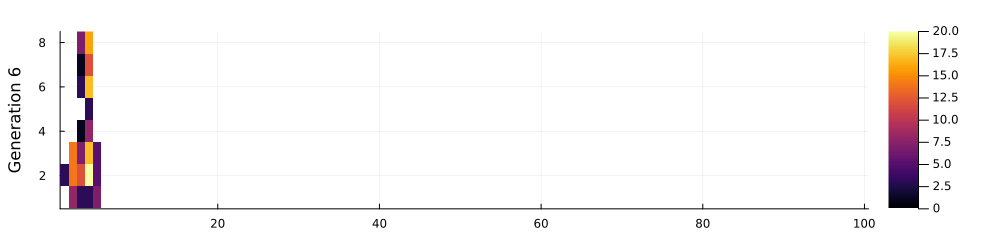

In [3]:
re_heatmap_pops(test;slow_factor=0.2)

Let's also see the distribution of selected beneficial mutations:

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_uxqpCvwNqH.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_uxqpCvwNqH.gif")
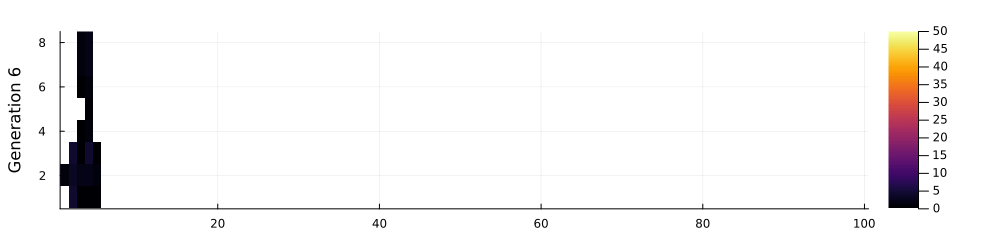

In [4]:
re_heatmap_bensel(test;slow_factor=0.2)

Now let's see the deme-average fitness distribution:

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_srKV4XqvuH.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_srKV4XqvuH.gif")
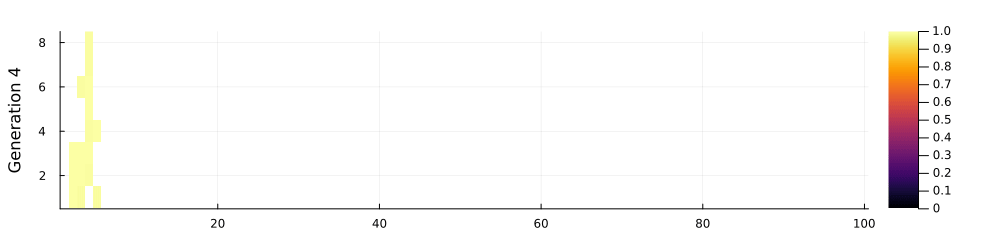

In [5]:
re_heatmap_fitn(test;slow_factor=0.333)

Notice how the fitness distribution gets higher (brighter) overall, after the whole space has been filled and the expansion is essentially stopped.

This can be confirmed with the mean fitness graphs:

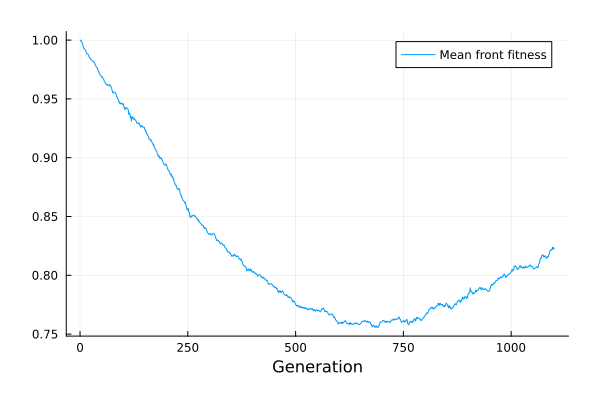

In [6]:
test_fitn_frontav = average_front(test,"fitn")
plot(test_fitn_frontav,xlabel="Generation",label="Mean front fitness")

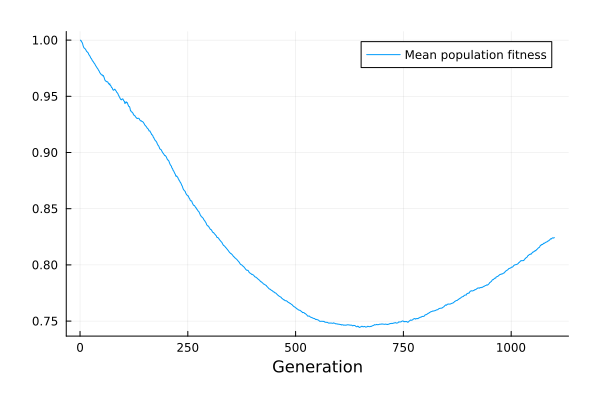

In [7]:
test_fitn_av = average_all(test,"fitn")
plot(test_fitn_av,xlabel="Generation",label="Mean population fitness")

The front array stays at the end after the space has been filled:

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_gBs9kNofq1.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_gBs9kNofq1.gif")
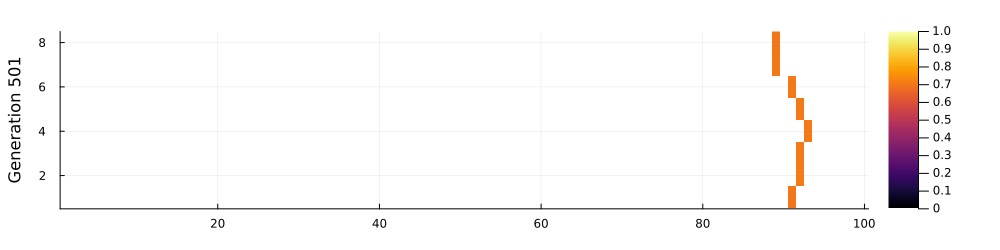

In [8]:
test_fitn_frontarr = front_array(test,"fitn";oneside=true)
re_heatmap_fitn(test_fitn_frontarr,500,600)